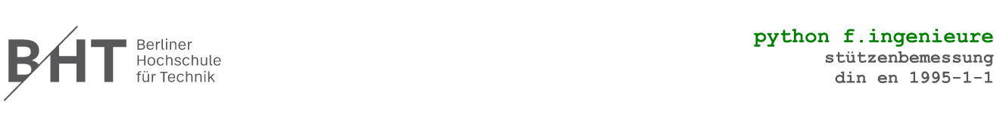

# Anwendungsbeispiel 1: Stützenbemessung

## Dokumentation

Um die Ergebnisse einer Bemessung verständlich zu dokumentieren, ist es als Ingenieur von großer Bedeutung übersichtliche und nachvollziehbare Grafiken zu erstellen.

Im Folgenden wird einerseits demonstriert, wie es mit der Interaktion von Python und AutoCAD möglich ist, eine automatisierte grafische Auswertung zu erzeugen und wie anhand von xlwings schriftliche Einzelnachweise als PDF exportiert werden können.

### Grafische Dokumentation

Grafische Übersichten eignen sich auf einer verständlichen und übersichtlichen Art und Weise Informationen zu präsentieren. Grade bei Zwischenergebnissen kann es zu ständigen Veränderungen und Anpassungen kommen, sodass die Erstellung einer grafischen Übersicht eine zeitintensive Aufgabe darstellen kann. Zusätzlich besteht bei manuell auszuführenden Arbeiten das hohe Risiko von Fehlern, die mit einer automatisierten Arbeitsweise minimiert werden können.

**Link zur Online-Dokumentation** <br>
[pyautocad](https://pyautocad.readthedocs.io/en/latest/)<br>

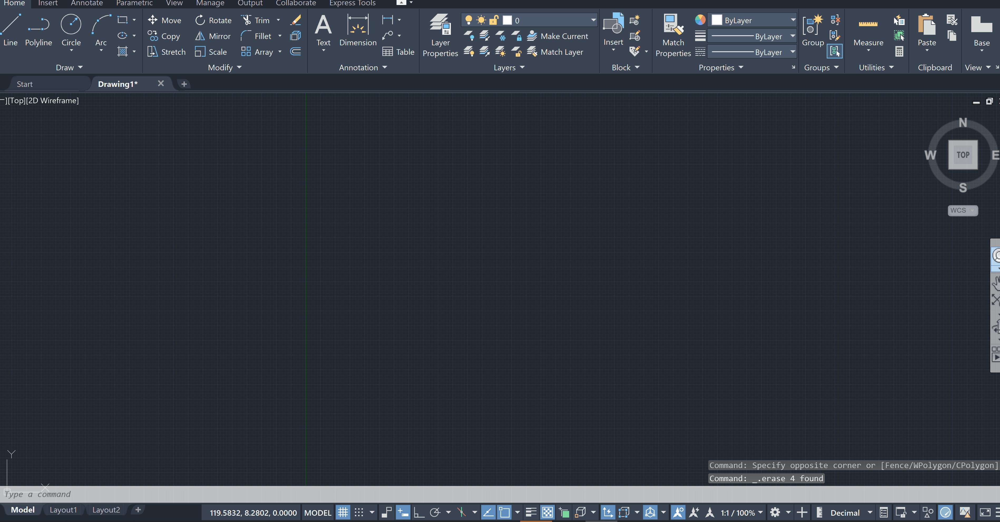

<div class="alert alert-block alert-warning">
<b>Anmerkung:</b> Der folgende Code funktioniert nur bei einer vorhandenen Installation von Autodesk AutoCAD.
</div>

<div class="alert alert-block alert-danger">
<b>Achtung:</b> Die Ausführung der folgenden Zeilen führt einen Code im Stützenbemessungsprogramm (Stützenbemessung_ec5_63.xlsm) aus.
</div>

#### Bibliothek: Pyautocad

Mit der Bibliothek **pyautocad** wird es ermöglicht, mit einfachen Befehlen mit Autodesk AutoCAD zu interagieren und simple geometrische Formen und Textelemente zu überführen. 

Die sonstige Vorgehensweise ist analog zu den bisherigen Skripten und wird im Folgenden nur kurz erläutert.

1. Verknüpfung mit Excel
2. Einlesen der Listen
3. Öffnen einer AutoCAD-Datei
```python
acad = Autocad(create_if_not_exists=True)
```
4. Zeichnen der Decke <br>
Anhand der Schleife durch die Liste der Deckenkoordinaten werden je Durchgang zwei Punkte definiert, die anschließend als Linie verbunden werden. 

```python
p1 = APoint(xx_coord[i], yy_coord[i])    # Punkt 1
p2 = APoint(xx_coord[i+1], yy_coord[i+1])    # Punkt 2
line1 = acad.model.AddLine(p1, p2)    # Linie zwischen Punkt 1 und 2
```
5. Zeichnen der Stützen <br>
Gleichermaßen wird durch die Stützenkoordinaten iteriert und gemäß der Bemessungsergebnisse die Koordinaten des Stützenquerschnittes berechnet und gezeichnet. Im selben Durchgang werden die zugehörigen Positionsinformationen in der Liste aufgerufen und als Textelement an die Stütze geschrieben. Um die Querschnitte und die Holzgüte farblich abzusetzen, wird mit dem zuvor ermittelten Index die Farbe gewählt.

```python
text = acad.model.AddText(pos[i]+ ' - '+ geschoss[i], pi, 0.2)
text.Color = L_color_güte[index_güte]
```

In [2]:
# Stützenbemessungsprogramm: Dokumentation - Grafische Übersicht mit AutoCAD
# Bibliotheken
from pyautocad import Autocad, APoint, aDouble, ACAD  # Interaktion mit AutoCAD
import xlwings as xw  # Interaktion mit Excel

# Verknüpfung mit Excel
wb = xw.Book('Stützenbemessung_ec5_63.xlsm')
ws_1 = wb.sheets['Lastabtrag']
ws_2 = wb.sheets['Stützenbemessung']

# Dynamisches Einlesen der Zeilenanzahl
startrow = 10
rownum = ws_2.range('G10').current_region.last_cell.row

# Koordinaten der Stützen und Decken
# Stützen
x_coord = ws_1.range((10, 13), (rownum, 13)).value
y_coord = ws_1.range((10, 14), (rownum, 14)).value

# Gebäudeaußenkante
xx_coord = ws_1.range((10, 17), (22, 17)).value
yy_coord = ws_1.range((10, 18), (22, 18)).value

# Einlesen der Stützenkennwerte in Listen
pos = ws_2.range((startrow, 7), (rownum, 7)).value
geschoss = ws_2.range((startrow, 8), (rownum, 8)).value
material = ws_2.range((startrow, 16), (rownum, 16)).value
L = ws_2.range((startrow, 10), (rownum, 10)).value
b = ws_2.range((startrow, 11), (rownum, 11)).value
h = ws_2.range((startrow, 12), (rownum, 12)).value
Ned = ws_2.range((startrow, 13), (rownum, 13)).value
Myd = ws_2.range((startrow, 14), (rownum, 14)).value
Mzd = ws_2.range((startrow, 15), (rownum, 15)).value

# Auswertung für die farbliche Gruppierung
# Güte
L_güte = ['GL 24h', 'GL 24c', 'GL 28h', 'GL 28c', 'GL 32h', 'GL 32c']
L_color_güte = [1, 1, 2, 2, 3, 3]

# Querschnitt
L_qs = []
b_oben = ws_2.range('D32').value
b_unten = ws_2.range('D33').value
b_steps = ws_2.range('D34').value
n_steps = (b_oben-b_unten)/b_steps
L_color_qs = []

for i in range(int(n_steps)):
    L_qs.append(round(b_unten+b_steps*i, 2))
    L_color_qs.append(i)

L_qs[-1] = b_oben

# AutoCAD
# Öffnen einer neuen Datei
acad = Autocad(create_if_not_exists=True)
#pii = APoint(xx_coord[0], yy_coord[0])

# Zeichnen der Decke
for i in range(0, 12):
    p1 = APoint(xx_coord[i], yy_coord[i])  # Punkt 1
    p2 = APoint(xx_coord[i+1], yy_coord[i+1])  # Punkt 2
    line1 = acad.model.AddLine(p1, p2)  # Linie zwischen Punkt 1 und 2

# Stützen
for i in range(len(x_coord)):

    # Index für Güte und Querschnitt
    index_güte = L_güte.index(material[i])
    index_qs = L_qs.index(round(b[i], 2))

    # Punktkoordinaten
    pi = APoint(x_coord[i], y_coord[i])
    p1 = APoint(x_coord[i]+b[i]*0.5, y_coord[i]+h[i]*0.5)  # Punkt 1
    p2 = APoint(x_coord[i]+b[i]*0.5, y_coord[i]-h[i]*0.5)  # Punkt 2
    p3 = APoint(x_coord[i]-b[i]*0.5, y_coord[i]-h[i]*0.5)  # Punkt 3
    p4 = APoint(x_coord[i]-b[i]*0.5, y_coord[i]+h[i]*0.5)  # Punkt 4

    # Zeichnen der Stütze
    line1 = acad.model.AddLine(p1, p2)  # Linie zwischen Punkt 1 und 2
    line2 = acad.model.AddLine(p2, p3)  # Linie zwischen Punkt 2 und 3
    line3 = acad.model.AddLine(p3, p4)  # Linie zwischen Punkt 3 und 4
    line4 = acad.model.AddLine(p4, p1)  # Linie zwischen Punkt 4 und 1

    # Anpassung der Farbe gemäß Index
    line1.Color = L_color_qs[index_qs]
    line2.Color = L_color_qs[index_qs]
    line3.Color = L_color_qs[index_qs]
    line4.Color = L_color_qs[index_qs]

    # Textelemente
    text = acad.model.AddText(pos[i] + ' - ' + geschoss[i], pi, 0.2)
    text1 = acad.model.AddText(
        material[i], APoint(x_coord[i], y_coord[i]-0.3), 0.2)
    text2 = acad.model.AddText('L/B/H = '+str(round(L[i], 2))+'/'+str(
        b[i]) + '/' + str(h[i])+' [m]', APoint(x_coord[i], y_coord[i]-0.6), 0.2)
    text3 = acad.model.AddText('Ned/Myd/Mzd = '+str(round(Ned[i], 2))+'/'+str(
        Myd[i]) + '/' + str(Mzd[i]), APoint(x_coord[i], y_coord[i]-0.9), 0.2)

    # Anpassung der Farbe gemäß Index
    text1.Color = L_color_güte[index_güte]

### Schriftliche Dokumentation

Nachdem man mit dem Excel-Programm die Stützen eines ganzen Geschosses berechnet hat, ist es im weiteren Verlauf notwendig, ausformulierte und vom beispielsweise Prüfstatiker nachvollziehbare Nachweise auszudrucken, die man im Bericht verwenden kann. Hierbei ist es nun nicht zweckmäßig das gesamte Geschoss auszudrucken, sodass die Möglichkeit angeboten werden sollte, einzelne Positionen auszuwählen. Dies wird ermöglicht, indem hinter einer Stützenposition ein „x" hingesetzt werden kann, sodass nur die gekennzeichneten Positionen vom Code erfasst werden. 

Beispielhaft ist in der Excel-Datei eine Vorlage für die Stützenbemessung nach der Theorie II. Ordnung hinterlegt, die für den PDF-Export verwendet wird. Das Skript funktioniert, indem die Schleife nacheinander die gekennzeichneten Positionen durchläuft und die Bemessungsergebnisse in die Vorlage einfügt und das Arbeitsblatt anschließend als PDF exportiert. Für jede Position wird demnach dieselbe Vorlage verwendet und die Daten für die nächste Position ersetzt. Somit wird gewährleistet, dass auf Knopfdruck ein Nachweis exportiert werden kann, die Datei selbst jedoch „schlank" bleibt. 

In der Zelle D41 der Excel-Datei wird ein Ordner für die PDF-Exporte angegeben. Mit dem Befehl ```to_pdf``` wird die Vorlage exportiert.

```python
pfad = ws_1.range("D41").value
pdf_file_name = pfad + "Stützenbemessung_ThII_" + L_pos[j]
ws_2.to_pdf(pdf_file_name)
```

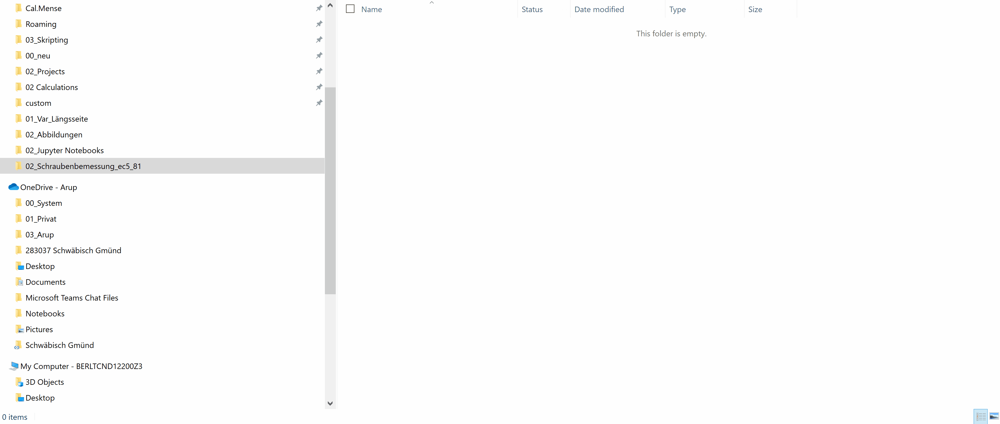

<div class="alert alert-block alert-danger">
<b>Achtung:</b> Die Ausführung der folgenden Zeilen führt einen Code im Stützenbemessungsprogramm (Stützenbemessung_ec5_63.xlsm) aus.
</div>

In [3]:
# Stützenbemessungsprogramm: Dokumentation - Schriftlicher Einzelnachweis als PDF
# Bibliotheken
import xlwings as xw  # Interaktion mit Excel
%run 3.4_Anwendungsbeispiel_1_Erstellung_von_Funktionen.ipynb

# Verknüpfung mit Excel
wb = xw.Book('Stützenbemessung_ec5_63.xlsm')
ws_1 = wb.sheets['Stützenbemessung']
ws_2 = wb.sheets['Theorie II. Ordnung']

# Dynamisches Einlesen der Zeilenanzahl
startrow = 10
rownum = ws_1.range('G10').current_region.last_cell.row
colnum = ws_1.range((startrow, 1)).current_region.last_cell.column

# Einlesen der Listen
L_pos = ws_1.range((startrow, 7), (rownum, 7)).value
L_ges = ws_1.range((startrow, 8), (rownum, 8)).value
L_system = ws_1.range((startrow, 9), (rownum, 9)).value
L_L = ws_1.range((startrow, 10), (rownum, 10)).value
L_b = ws_1.range((startrow, 11), (rownum, 11)).value
L_h = ws_1.range((startrow, 12), (rownum, 12)).value
L_N_ed = ws_1.range((startrow, 13), (rownum, 13)).value
L_M_yd = ws_1.range((startrow, 14), (rownum, 14)).value
L_M_zd = ws_1.range((startrow, 15), (rownum, 15)).value
L_h_art = ws_1.range((startrow, 16), (rownum, 15)).value
L_f_c0k = ws_1.range((startrow, 17), (rownum, 17)).value
L_f_myk = ws_1.range((startrow, 18), (rownum, 18)).value
L_E0mean = ws_1.range((startrow, 19), (rownum, 19)).value
L_E_05 = ws_1.range((startrow, 20), (rownum, 20)).value
L_G_05 = ws_1.range((startrow, 21), (rownum, 21)).value
L_k_mod = ws_1.range((startrow, 22), (rownum, 22)).value
L_gamma = ws_1.range((startrow, 23), (rownum, 23)).value

# Schleife durch Stützenpositionen
for j in range(rownum - startrow + 1):

    # Ermittlung der gekennzeichneten Positionen
    if ws_1.range("BJ10").offset(j, 0).value == "x":

        # Einlesen der Kennwerte gemäß Index
        L = L_L[j]
        b = L_b[j]
        h = L_h[j]
        f_c0k = L_f_c0k[j]*1000
        f_myk = L_f_myk[j]*1000
        f_mzk = f_myk
        E0_mean = L_E0mean[j]*1000
        E_05 = L_E_05[j]*1000
        k_mod = L_k_mod[j]
        gamma = L_gamma[j]
        N_ed = L_N_ed[j]
        M_yd = L_M_yd[j]
        M_zd = L_M_zd[j]
        güte = L_h_art[j]
        Lagerung = L_system[j]
        theta = ws_1.range("D24").value
        no_iter = 9
        E = E0_mean/1.3

        # Auswertung der Kennwerte
        shi = k_mod/gamma
        f_c0d = f_c0k*shi
        f_myd = f_myk*shi

        A = b*h
        I = b*h**3/12
        w = (b*h**2)/6
        i = (I/A)**0.5

        # Bemessung mit Funktion
        L_e, L_M, L_e_total, L_M_total, sigma_cd, L_sigma_mIId, eta, index = ec5_63_th2(
            Lagerung, güte, L, b, h, N_ed, M_yd, M_zd, theta, f_c0k, f_myk, f_mzk, E, k_mod, gamma, no_iter)

        #Schreiben in bemessungsvorlage
        # Geometrie
        ws_2.range('I4').value = L_pos[j]
        ws_2.range('T49').value = index

        # Geometrie
        start = ws_2.range('E14')
        start.offset(0, 0).value = L
        start.offset(0, 13).value = b
        start.offset(0, 26).value = h

        # Bemessungswerte der Einwirkung
        start = ws_2.range('E17')
        start.offset(0, 0).value = N_ed
        start.offset(0, 13).value = M_yd
        start.offset(0, 26).value = M_zd

        # Charakteristische Festigkeitswerte
        start = ws_2.range('F21')
        start.offset(0, 0).value = f_c0k
        start.offset(0, 16).value = f_myk
        start.offset(1, 0).value = E0_mean

        # Widerstandsbeiwerte
        start = ws_2.range('F25')
        start.offset(0, 0).value = k_mod
        start.offset(0, 16).value = gamma

        # Charakteristische Festigkeitswerte
        start = ws_2.range('F34')
        start.offset(0, 0).value = f_c0d
        start.offset(0, 16).value = f_myd
        start.offset(1, 0).value = E0_mean/1.3

        # Schnittgrößenermittlung nach Theorie II. Ordnung
        start = ws_2.range('E61')
        start.offset(0, 0).options(transpose=True).value = L_e[0]
        start.offset(0, 6).options(transpose=True).value = L_M[0]
        start.offset(0, 12).options(transpose=True).value = L_e_total[0]
        start.offset(0, 18).options(transpose=True).value = L_M_total[0]

        start = ws_2.range('E80')
        start.offset(0, 0).options(transpose=True).value = L_e[1]
        start.offset(0, 6).options(transpose=True).value = L_M[1]
        start.offset(0, 12).options(transpose=True).value = L_e_total[1]
        start.offset(0, 18).options(transpose=True).value = L_M_total[1]

        # PDF export
        pfad = ws_1.range("D41").value
        pdf_file_name = pfad + "Stützenbemessung_ThII_" + L_pos[j]
        ws_2.to_pdf(pdf_file_name)

___
Berliner Hochschule für Technik (BHT) | Konstruktiver Hoch- und Ingenieurbau (M.Eng.) <br>
Ingenieurholzbau | Prof. Dr. Jens Kickler | Cal Mense 914553 | September 2022